# DSAI MINI PROJECT
#### Min Hui, Sherna, Ezekiel
Go to <a href=#ret>Data Retrieval</a><br>
Go to <a href=#ea>Exploratory Analysis</a><br>
Go to <a href=#c>Choropleth</a><br>
Go to <a href=#bhv>Boxplot, histogram, violinplot</a><br>
Go to <a href=#corr>Multivariate Correlation</a><br>
Go to <a href=#lr>Linear Regression</a><br>
Go to <a href=#wgimulti>World Governanace Index pairplot</a><br>
Go to <a href=#govregression>Multivariate regression (governance)</a><br>
Go to <a href=#nn>Neural Network</a><br>
## Basic:

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
%run retrieve.ipynb #retriever
sb.set() # set the default Seaborn style for graphics

# Common plotly libraries
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)
retrieve_init()


# Data Retrieval <a name='ret' />
### At any one time, work with only two datasets to manage easier 

In [2]:
trainYear = 2017
combineTrain, xTrain, yTrain, combineTrainFull = retrieve(trainYear)

In [3]:
testYear = 2015
combineTest, xTest, yTest, combineTestFull  = retrieve(testYear)

## Exploratory Analysis <a name='ea' />

### Choropleth <a name='c' />
Allows us to get a brief idea of data, can dive deeper by mousing over

In [7]:
scl = [
    [0.0, 'rgb(128,0,0)'],
    [0.2, 'rgb(178,34,34)'],
    [0.4, 'rgb(205,92,92)'],
    [0.6, 'rgb(240,128,128)'],
    [0.8, 'rgb(233,150,122)'],
    [1.0, 'rgb(255,160,122)']
]

data_slider = []
variables = combineTrain.columns.values.tolist()
index = variables[1:]

for var in index:
    data_each_yr = dict(
                        visible = False,
                        type='choropleth',
                        locations = combineTrain.index.values.tolist(),
                        z = combineTrain[var],
                        text = combineTrain['Country'],
                        colorscale = scl,
                        reversescale = True,
                        marker = go.choropleth.Marker(
                            line = go.choropleth.marker.Line(
                                color = 'rgb(180,180,180)',
                                width = 1
                            )),
                        colorbar = go.choropleth.ColorBar(
                            tickprefix = '',
                            title = str('')))
    
    data_slider.append(data_each_yr)

data_slider[0]['visible'] = True
    
steps = []

i = 0
for var in index:
    step = dict(method = "restyle",
                args=['visible', [False] * len(data_slider)],
                label='{}'.format(var))
    step['args'][1][i] = True
    i += 1
    steps.append(step)

sliders = [dict(active=0, pad={"t": 1}, steps=steps)]
    
    
layout = dict(title ='World Happiness Record Variables', geo=dict(
                       projection={'type': 'equirectangular'},
                        showframe=False),
              sliders=sliders)

fig = dict(data=data_slider, layout=layout)
py.iplot(fig)

### Boxplot, histogram, violinplot  <a name='bhv' />

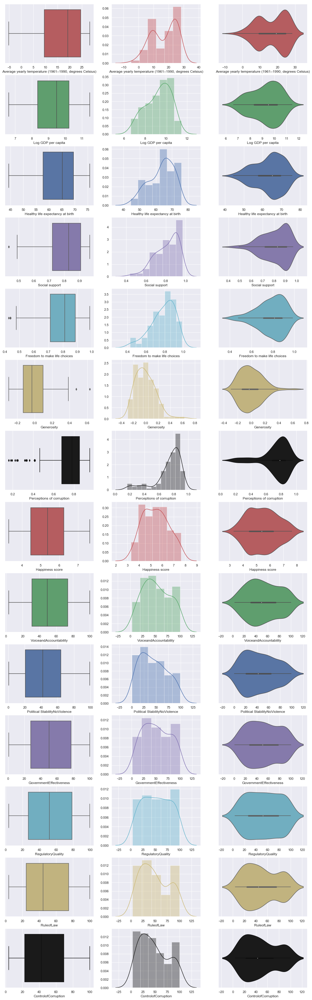

In [10]:
data = combineTrain.drop('Country', axis=1)


f, axes = plt.subplots(14, 3, figsize=(18, 60))
colors = ["r", "g", "b", "m", "c", "y","k", "r", "g", "b", "m", "c", "y","k"]

count = 0
for var in data:
    sb.boxplot(data[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.distplot(data[var], kde = True, color = colors[count], ax = axes[count,1])
    sb.violinplot(data[var], color = colors[count], ax = axes[count,2])
    count += 1

### Multivariate correlation <a name='corr' />

In [11]:
# Heatmap of the Correlation Matrix using plotly
trace = go.Heatmap(z = combineTrain.corr(), 
                   x = combineTrain.columns, 
                   y = combineTrain.columns, 
                   colorscale = 'Hot',
                   reversescale = True)
data=[trace]
py.iplot(data, filename='labelled-heatmap')

## Linear Regression <a name='lr' />

Average yearly temperature (1961–1990, degrees Celsius)
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [6.44889187]
Coefficients 	: a =  [[-0.05978316]]
Explained Variance (R^2) on Train Set 	: 0.20929669609522028
Explained Variance (R^2) on Test Set 	: 0.22952611380284035


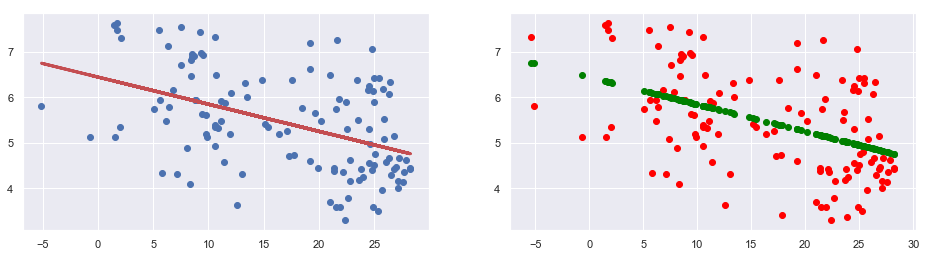

Log GDP per capita
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [-1.44756419]
Coefficients 	: a =  [[0.74400679]]
Explained Variance (R^2) on Train Set 	: 0.6479058891082845
Explained Variance (R^2) on Test Set 	: 0.6580560955789765


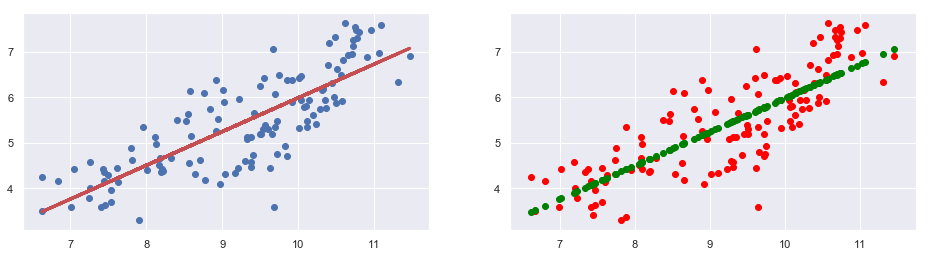

Healthy life expectancy at birth
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [-1.60429947]
Coefficients 	: a =  [[0.11120781]]
Explained Variance (R^2) on Train Set 	: 0.6022419685730522
Explained Variance (R^2) on Test Set 	: 0.6093197296577011


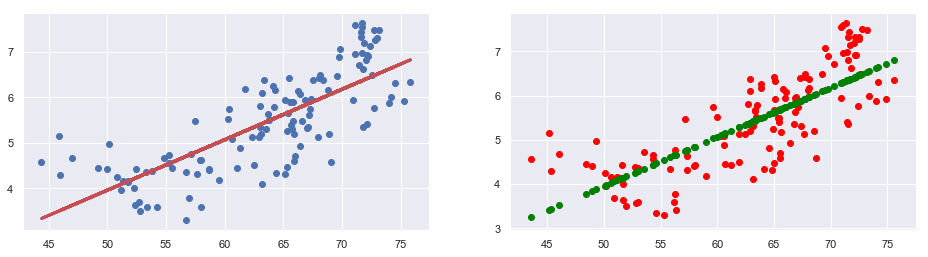

Social support
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [-0.55404326]
Coefficients 	: a =  [[7.41732634]]
Explained Variance (R^2) on Train Set 	: 0.6277189161656478
Explained Variance (R^2) on Test Set 	: 0.5183211931916398


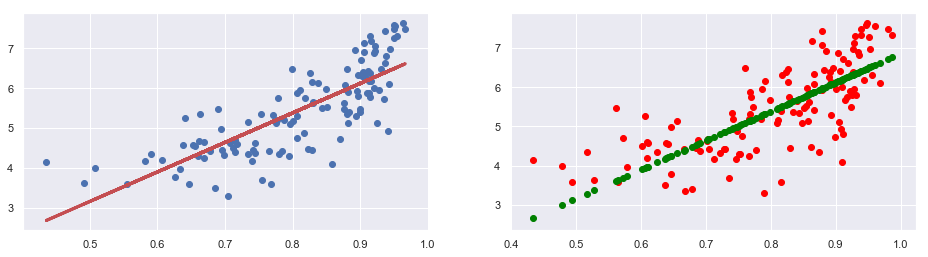

Freedom to make life choices
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [2.12419397]
Coefficients 	: a =  [[4.24818287]]
Explained Variance (R^2) on Train Set 	: 0.24505735861999367
Explained Variance (R^2) on Test Set 	: 0.24817135741382945


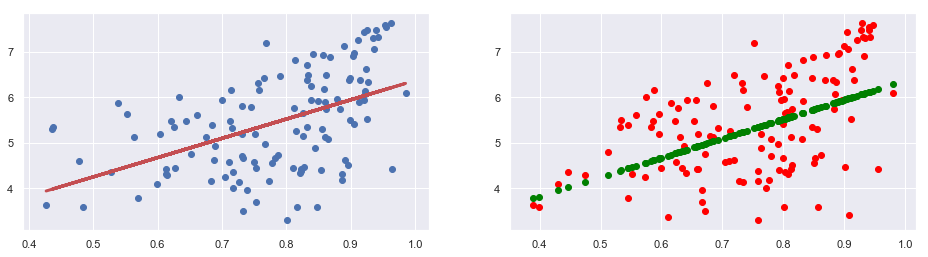

Generosity
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [5.4514479]
Coefficients 	: a =  [[0.91771635]]
Explained Variance (R^2) on Train Set 	: 0.01846282585409642
Explained Variance (R^2) on Test Set 	: 0.031968081617429034


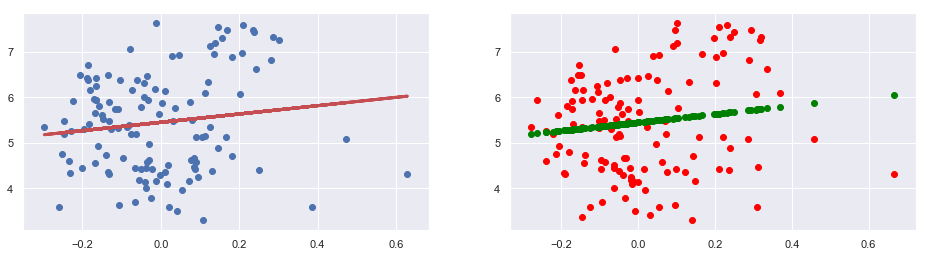

Perceptions of corruption
Train Set : (122, 1) (122, 1)
Test Set  : (126, 1) (126, 1)
Intercept 	: b =  [7.70170744]
Coefficients 	: a =  [[-3.07511534]]
Explained Variance (R^2) on Train Set 	: 0.25732825386416913
Explained Variance (R^2) on Test Set 	: 0.21512918115547774


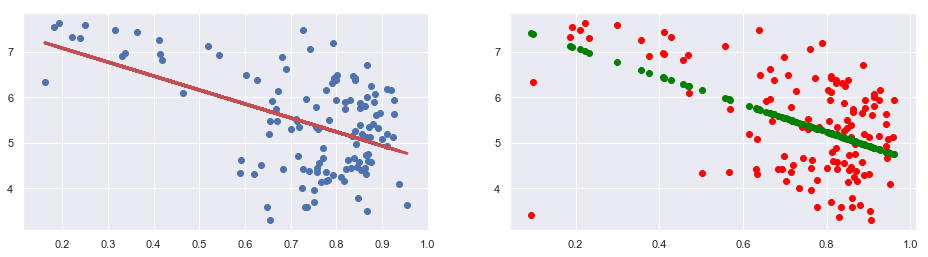

In [12]:
# Import LinearRegression model from Scikit-Learn
from sklearn.linear_model import LinearRegression

colors = ["r", "g", "b", "m", "c", "y",'r']
count = 0
variables = ['Average yearly temperature (1961–1990, degrees Celsius)','Log GDP per capita', 'Healthy life expectancy at birth', 'Social support', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']

for i in variables:
    # Create a Linear Regression object
    linreg = LinearRegression()
    from sklearn.model_selection import train_test_split
    
    X_train = combineTrain[[i]]
    y_train = combineTrain[['Happiness score']]
    #retrieve(testYear)
    X_test = combineTest[[i]]
    y_test = combineTest[['Happiness score']]
    from sklearn.linear_model import LinearRegression
    lm = LinearRegression()
    lm.fit(X_train,y_train)

    # Check the sample sizes
    print(i)
    print("Train Set :", X_train.shape, y_train.shape)
    print("Test Set  :", X_test.shape, y_test.shape)
    print('Intercept \t: b = ', lm.intercept_)
    print('Coefficients \t: a = ', lm.coef_)

    r2_gdp_train = lm.score(X_train, y_train)
    print("Explained Variance (R^2) on Train Set \t:", r2_gdp_train)
    
    r2_gdp_test = lm.score(X_test, y_test)
    print("Explained Variance (R^2) on Test Set \t:", r2_gdp_test)

    # Formula for the Regression line
    regline_x = X_train
    regline_y = lm.intercept_ + lm.coef_ * X_train
    
    # Plot the Linear Regression line
    f, axes = plt.subplots(1, 2, figsize=(16, 4))
    axes[0].scatter(X_train, y_train)
    axes[0].plot(regline_x, regline_y, 'r-', linewidth = 3)

    
    y_test_pred = lm.predict(X_test)
    axes[1].scatter(X_test, y_test, color = "red")
    axes[1].scatter(X_test, y_test_pred, color = "green")
    #plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
    plt.show()
    count += 1

## World Governanace Index pairplot <a name='wgimulti' />

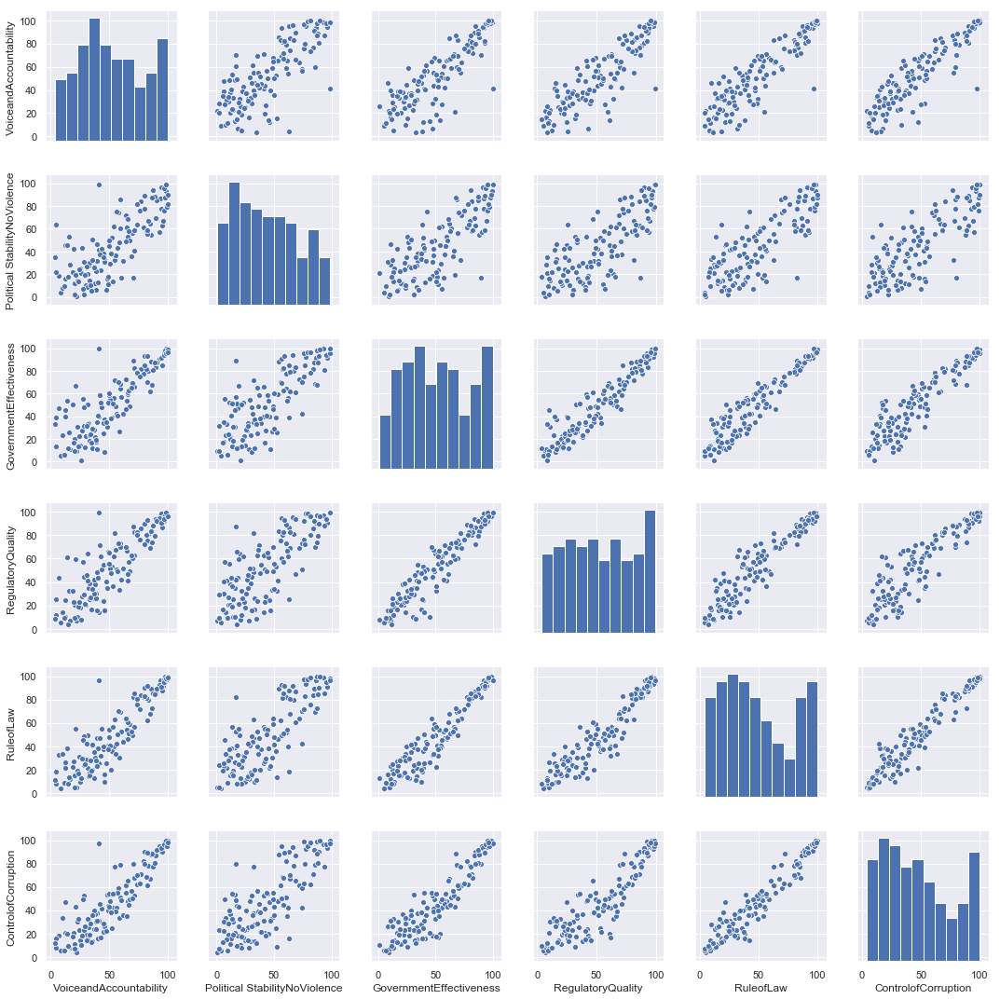

In [13]:
multi = pd.DataFrame(combineTrain[['VoiceandAccountability', 'Political StabilityNoViolence', 'GovernmentEffectiveness','RegulatoryQuality', 'RuleofLaw', 'ControlofCorruption']])
sb.pairplot(multi)

## Multivariate regression (governance) <a name='govregression' />

Intercept 	: b =  [3.7373547]
Coefficients 	: a =  [[ 0.00967309  0.00254036  0.0354739   0.00712826 -0.01942993 -0.0034089 ]]
Train Set : (122, 6) (122, 1)
Test Set  : (126, 6) (126, 1)


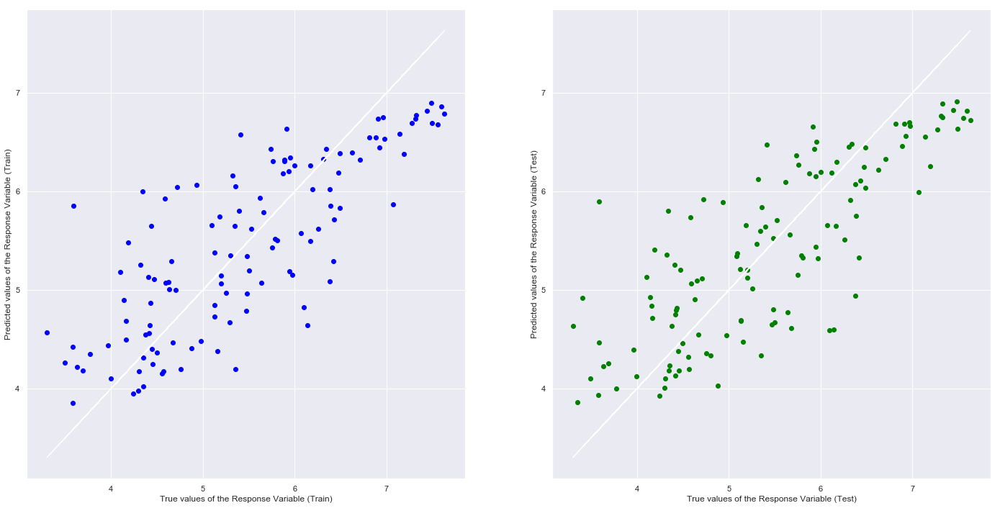

Explained Variance (R^2) on Train Set 	: 0.6220641736729298
Explained Variance (R^2) on Test Set 	: 0.6394364375945764


In [14]:
# Import LinearRegression model from Scikit-Learn
from sklearn.linear_model import LinearRegression

# Split the dataset into Train and Test       
predictors_train = pd.DataFrame(combineTrain[['VoiceandAccountability', 'Political StabilityNoViolence', 'GovernmentEffectiveness', 'RegulatoryQuality', 'RuleofLaw', 'ControlofCorruption']])
happiness_train = pd.DataFrame(combineTrain[['Happiness score']])
predictors_test = pd.DataFrame(combineTest[['VoiceandAccountability', 'Political StabilityNoViolence', 'GovernmentEffectiveness', 'RegulatoryQuality', 'RuleofLaw', 'ControlofCorruption']])
happiness_test = pd.DataFrame(combineTest[['Happiness score']])

# Create a Linear Regression object
linreg = LinearRegression()

# Train the Linear Regression model
linreg.fit(predictors_train, happiness_train)

print('Intercept \t: b = ', linreg.intercept_)
print('Coefficients \t: a = ', linreg.coef_)


# Predict Happiness values 
happiness_train_pred = linreg.predict(predictors_train)
happiness_test_pred = linreg.predict(predictors_test)
print("Train Set :", predictors_train.shape, happiness_train.shape)
print("Test Set  :", predictors_test.shape, happiness_test.shape)
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(happiness_train, happiness_train_pred, color = "blue")
axes[0].plot(happiness_train, happiness_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(happiness_test, happiness_test_pred, color = "green")
axes[1].plot(happiness_test, happiness_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

print("Explained Variance (R^2) on Train Set \t:", linreg.score(predictors_train, happiness_train))
print("Explained Variance (R^2) on Test Set \t:", linreg.score(predictors_test, happiness_test))

## Neural Network <a name='nn' />
#### (mlp.score may vary across multiple mlp.fit runs)

In [15]:
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
#max iterations 100k, 3 layers, 13 neurons each (to match 13 input variables)
mlp = MLPRegressor(max_iter =100000, hidden_layer_sizes=(13,13,13))

#fit and test
mlp.fit(xTrain,yTrain)
mlp.score(xTrain,yTrain)

C:\Users\zekit\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:1316: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.835088245911085

In [16]:
#check store of test data
mlp.score(xTest,yTest)

0.8048120583164582

In [17]:
index = xTest.index.get_loc('CHE')
print(xTest.iloc[index])
print("Actual: " ,yTest[index])
print("Prediction: " ,mlp.predict([xTest.iloc[index]]))

Average yearly temperature (1961–1990, degrees Celsius)     5.500000
Log GDP per capita                                         10.955430
Healthy life expectancy at birth                           73.173759
Social support                                              0.938334
Freedom to make life choices                                0.927802
Generosity                                                  0.095988
Perceptions of corruption                                   0.209534
VoiceandAccountability                                     98.522171
Political StabilityNoViolence                              96.666664
GovernmentEffectiveness                                    99.519234
RegulatoryQuality                                          95.192307
RuleofLaw                                                  97.596153
ControlofCorruption                                        97.596153
Name: CHE, dtype: float64
Actual:  [74872]
Prediction:  [71819.5233317]


### (2018 retrieval, custom written code to accomodate different sheet names)

In [19]:

global maintable
global tempdata
global happy
# global combine
#INPUT TEST YEAR HERE
yearstring = str((2017+1)%100)
#grab relevant columns, change column names and set index

b1 = pd.read_excel('wgidataset.xlsx', sheet_name = 'VoiceandAccountability', header = 14)
b1 = b1[["WBCode", "Rank."+yearstring]]
b1.columns = ["ISO 3166 ALPHA-3", "VoiceandAccountability"]
b1.set_index('ISO 3166 ALPHA-3', inplace=True)

b2 = pd.read_excel('wgidataset.xlsx', sheet_name = 'Political StabilityNoViolence', header = 14)
b2 = b2[["WBCode", "Rank."+yearstring]]
b2.columns = ["ISO 3166 ALPHA-3", "Political StabilityNoViolence"]
b2.set_index('ISO 3166 ALPHA-3', inplace=True)

b3 = pd.read_excel('wgidataset.xlsx', sheet_name = 'GovernmentEffectiveness', header = 14)
b3 = b3[["WBCode", "Rank."+yearstring]]
b3.columns = ["ISO 3166 ALPHA-3", "GovernmentEffectiveness"]
b3.set_index('ISO 3166 ALPHA-3', inplace=True)

b4 = pd.read_excel('wgidataset.xlsx', sheet_name = 'RegulatoryQuality', header = 14)
b4 = b4[["WBCode", "Rank."+yearstring]]
b4.columns = ["ISO 3166 ALPHA-3", "RegulatoryQuality"]
b4.set_index('ISO 3166 ALPHA-3', inplace=True)

b5 = pd.read_excel('wgidataset.xlsx', sheet_name = 'RuleofLaw', header = 14)
b5 = b5[["WBCode", "Rank."+yearstring]]
b5.columns = ["ISO 3166 ALPHA-3", "RuleofLaw"]
b5.set_index('ISO 3166 ALPHA-3', inplace=True)

b6 = pd.read_excel('wgidataset.xlsx', sheet_name = 'ControlofCorruption', header = 14)
b6 = b6[["WBCode", "Rank."+yearstring]]
b6.columns = ["ISO 3166 ALPHA-3", "ControlofCorruption"]
b6.set_index('ISO 3166 ALPHA-3', inplace=True)

happy = pd.read_excel('v1_original.xls', sheet_name = 'Figure2.2', header = 0)
happy = happy[["Country", "Happiness score"]]

# Extract the 6 columns (independent variables) out
a16 = pd.read_excel('Chapter2OnlineData.xls', sheet_name = 'Table2.1', header = None)
a16.columns = a16.iloc[0]   # copy first row to column names
a16 = a16.drop(0)           # drop the first row (redundant)
# loop thru the cols convert object to float datatype
cols=[i for i in a16.columns if i not in ["Country name"]]
for col in cols:
    a16[col]=pd.to_numeric(a16[col])

# print to ensure they are converted to float64

a16w = a16.loc[a16['Year'] == 2018]
a16x = a16w[['Country name',
                        'Log GDP per capita',
                        'Healthy life expectancy at birth',
                        'Social support',
                        'Freedom to make life choices',
                        'Generosity',
                        'Perceptions of corruption']]
a16x.columns.values[0]= 'Country'


#start with merging temperature and ISO 3166 codes
combine = pd.merge(tempdata, maintable, how="outer", on="Country")
combine = combine.reset_index()
#check for differences and replace
cb = combine[combine['ISO 3166 ALPHA-3'].isnull()==True]
cb
combine["Country"] = combine["Country"].replace('Federated States of Micronesia', 'Micronesia')
combine["Country"] = combine["Country"].replace('East Timor','Timor-Leste')
combine["Country"] = combine["Country"].replace('São Tomé', 'São Tomé and Príncipe')
combine["Country"] = combine["Country"].replace('Sao Tome and Principe', 'São Tomé and Príncipe')
combine["Country"] = combine["Country"].replace('North Macedonia', 'Macedonia')
combine = combine.groupby(combine['Country']).last()
combine = combine.reset_index()

#next, merge happiness index and WHR variables
combine = pd.merge(combine, a16x, how="outer", on="Country")
combine = pd.merge(combine, happy, how="outer", on="Country")
#check for differences and replace
cb = combine[combine['ISO 3166 ALPHA-3'].isnull()==True]
cb
combine["Country"] = combine["Country"].replace('Congo (Brazzaville)', 'Republic of the Congo')
combine["Country"] = combine["Country"].replace('Congo (Kinshasa)', 'Democratic Republic of the Congo')
combine["Country"] = combine["Country"].replace('Hong Kong S.A.R. of China', 'Hong Kong')
combine = combine[combine["Country"] != "Palestinian Territories"] #drop
combine["Country"] = combine["Country"].replace('Taiwan Province of China', 'Taiwan')
combine = combine.groupby(combine['Country']).last()
combine = combine.reset_index()

#next, merge with WGI data
combine = pd.merge(combine, b1, how="outer", on="ISO 3166 ALPHA-3")
combine = pd.merge(combine, b2, how="outer", on="ISO 3166 ALPHA-3")
combine = pd.merge(combine, b3, how="outer", on="ISO 3166 ALPHA-3")
combine = pd.merge(combine, b4, how="outer", on="ISO 3166 ALPHA-3")
combine = pd.merge(combine, b5, how="outer", on="ISO 3166 ALPHA-3")
combine = pd.merge(combine, b6, how="outer", on="ISO 3166 ALPHA-3")
#check for differences and replace
cb = combine[combine['Country'].isnull()==True]
cb
combine["ISO 3166 ALPHA-3"] = combine["ISO 3166 ALPHA-3"].replace('ADO', 'AND')
combine["ISO 3166 ALPHA-3"] = combine["ISO 3166 ALPHA-3"].replace('KSV', 'RKS')
combine["ISO 3166 ALPHA-3"] = combine["ISO 3166 ALPHA-3"].replace('ROM', 'ROU')
combine["ISO 3166 ALPHA-3"] = combine["ISO 3166 ALPHA-3"].replace('TMP', 'TLS')
combine["ISO 3166 ALPHA-3"] = combine["ISO 3166 ALPHA-3"].replace('ZAR', 'COD')
combine = combine[combine["ISO 3166 ALPHA-3"] != "WBG"] #drop
combine = combine.groupby(combine["ISO 3166 ALPHA-3"]).last()

#drop null
combineFull = combine
combine = combine.dropna()


#to excel
combine.to_excel("final_data.xlsx")
x = combine.drop('Country', axis=1).drop('Happiness score', axis=1)#.drop('Average yearly temperature (1961–1990, degrees Celsius)', axis=1)

y = combine[["Happiness score"]]
y = y * 10000
y = y.astype(int)
y = y.values